In [1]:
#import package

import pandas as pd
import string
import nltk
import re
import sys
import numpy as np
import lda
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

from collections import Counter
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS

mpl.rcParams['figure.figsize']=(10.0,8.0)    #(6.0,4.0)
mpl.rcParams['font.size']=10                #10 
mpl.rcParams['savefig.dpi']=100             #72 
mpl.rcParams['figure.subplot.bottom']=.1

In [2]:
#input data

input=pd.read_csv('D:\KULIAH S2\TESIS\data_keluhan_coba.csv',header=0,encoding='utf8')
input_df=pd.DataFrame(data=input)
pd.options.display.max_colwidth=2000
print(input_df)  

        no  keluhan_id  \
0        1        8550   
1        2        2037   
2        3        4933   
3        4        8551   
4        5        8552   
5        6        8553   
6        7        8554   
7        8        8555   
8        9         238   
9       10        8556   
10      11        8557   
11      12         273   
12      13        8558   
13      14         269   
14      15         256   
15      16        3215   
16      17        8560   
17      18        8561   
18      19        8566   
19      20        1927   
20      21        3933   
21      22        2912   
22      23        5228   
23      24        1223   
24      25         453   
25      26         381   
26      27         387   
27      28         368   
28      29         362   
29      30        8568   
...    ...         ...   
4176  4177        8478   
4177  4178        8476   
4178  4179        8470   
4179  4180        8473   
4180  4181        8471   
4181  4182        8472   
4182  4183  

In [3]:
#ambil kolom opini

opini_df=input_df['keluhan']
print(opini_df) 


0                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                       

In [4]:
#hapus baris

noline=[]
for line in opini_df :
    result=re.sub('\n',' ',line)
    noline.append(result)
    
print(noline)

['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang 5 no 58B ini sudah 6bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat. Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II, hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat, hal ini mohn segera di tangani. Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak 4 titik. Mohon untuk segera ditindaklanjuti. Terima kasih.', '@e100ss sudah beberapa hari ini tumpukan sampah di sepanjang Jl. Banyu Urip bawah @SapawargaSby', '@SapawargaSby mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo. Terima kasih', '@SapawargaSby Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu. Lokasi di TPU Medokan Ayu.', 'selamat siang admin, saya mau menanyakan tentang perpanjangan perijinan warnet, saya 

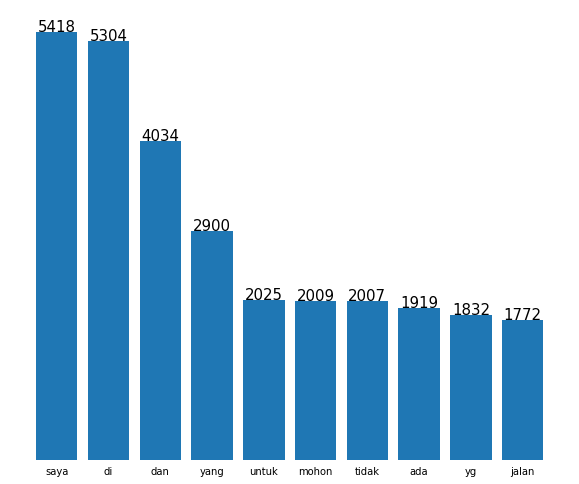

In [5]:
# Create a list of words by converting to lowercase and splitting
kata = [s.lower().split() for s in noline if s]
noline_ = [sublist for l in kata for sublist in l]
counts1 = dict(Counter(noline_).most_common(10))
labels1, values1 = zip(*counts1.items())

# sort your values in descending order
indSort1 = np.argsort(values1)[::-1]

# rearrange your data
labels1 = np.array(labels1)[indSort1]
values1 = np.array(values1)[indSort1]

indexes1 = np.arange(len(labels1))

bar_width = 1

mybar=plt.bar(indexes1, values1)
# get rid of the frame
for spine in plt.gca().spines.values():
    spine.set_visible(False)

# remove all the ticks and directly label each bar with respective value
plt.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')

# plt.show()

# direct label each bar with Y axis values
for bari in mybar:
    height = bari.get_height()
    plt.gca().text(bari.get_x() + bari.get_width()/2, bari.get_height()-0.2, str(int(height)),
                 ha='center', color='black', fontsize=15)
# add labels
plt.xticks(indexes1, labels1)
plt.show()



In [6]:
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer()
a = vec.fit_transform(noline)
terms1 = vec.get_feature_names()
print(len(terms1))



15564


In [7]:
num_words = 0
for line in noline:
    words = line.split()
    num_words += len(words)
print("Number of words:")
print(num_words)

Number of words:
213079


In [8]:
#hapus url link

nolink=[]
for line in noline:
    result=re.sub(r"http\S+","",line)
    nolink.append(result)
    
print(nolink)


['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang 5 no 58B ini sudah 6bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat. Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II, hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat, hal ini mohn segera di tangani. Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak 4 titik. Mohon untuk segera ditindaklanjuti. Terima kasih.', '@e100ss sudah beberapa hari ini tumpukan sampah di sepanjang Jl. Banyu Urip bawah @SapawargaSby', '@SapawargaSby mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo. Terima kasih', '@SapawargaSby Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu. Lokasi di TPU Medokan Ayu.', 'selamat siang admin, saya mau menanyakan tentang perpanjangan perijinan warnet, saya 

In [9]:
#hapus angka

from string import digits
nodigits=[]
for line in noline:
    remove_digits=str.maketrans(' ', ' ', digits)
    result=line.translate(remove_digits)
    nodigits.append(result)
print(nodigits)

['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang  no B ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat. Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II, hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat, hal ini mohn segera di tangani. Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak  titik. Mohon untuk segera ditindaklanjuti. Terima kasih.', '@ess sudah beberapa hari ini tumpukan sampah di sepanjang Jl. Banyu Urip bawah @SapawargaSby', '@SapawargaSby mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo. Terima kasih', '@SapawargaSby Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu. Lokasi di TPU Medokan Ayu.', 'selamat siang admin, saya mau menanyakan tentang perpanjangan perijinan warnet, saya coba mas

In [10]:
#hapus @username

nouser=[]
for line in nodigits :
    result=re.sub(r"(?:\@|https?\://)\S+", "", line)
    nouser.append(result)
    
print(nouser)

['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang  no B ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat. Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II, hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat, hal ini mohn segera di tangani. Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak  titik. Mohon untuk segera ditindaklanjuti. Terima kasih.', ' sudah beberapa hari ini tumpukan sampah di sepanjang Jl. Banyu Urip bawah ', ' mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo. Terima kasih', ' Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu. Lokasi di TPU Medokan Ayu.', 'selamat siang admin, saya mau menanyakan tentang perpanjangan perijinan warnet, saya coba masuk ke ssw surabaya, saya lihat di sana suda

In [11]:
#replace , menjadi whitespace

nocomma=[]
for line in nouser :
    result=re.sub(r"[,./]+", " ", line)
    nocomma.append(result)
    
print(nocomma)


['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang  no B ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat  Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II  hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat  hal ini mohn segera di tangani  Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak  titik  Mohon untuk segera ditindaklanjuti  Terima kasih ', ' sudah beberapa hari ini tumpukan sampah di sepanjang Jl  Banyu Urip bawah ', ' mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo  Terima kasih', ' Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu  Lokasi di TPU Medokan Ayu ', 'selamat siang admin  saya mau menanyakan tentang perpanjangan perijinan warnet  saya coba masuk ke ssw surabaya  saya lihat di sana suda

In [12]:
#remove punctuation
nopunc=[]
for line in nocomma:
    punc = set(string.punctuation)-set('-')
    result = ''.join(x for x in line if x not in punc)
    nopunc.append(result)
print(nopunc)


['saya ingin menginfokan kondisi air PDAM daerah simo pomahan baru barat gang  no B ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'Kepada Pemkot Surabaya setempat  Saya ingin melaporkan penuhnya sampah pada got di Simolawang Baru Sekolahan Gang II  hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat  hal ini mohn segera di tangani  Terimakasih Robert Prayogo', 'Saya ingin melaporkan lampu pertamanan Jalan Kedung Sroko I  Surabaya mati semua sebanyak  titik  Mohon untuk segera ditindaklanjuti  Terima kasih ', ' sudah beberapa hari ini tumpukan sampah di sepanjang Jl  Banyu Urip bawah ', ' mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo  Terima kasih', ' Mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah Kelurahan Medokan Ayu  Lokasi di TPU Medokan Ayu ', 'selamat siang admin  saya mau menanyakan tentang perpanjangan perijinan warnet  saya coba masuk ke ssw surabaya  saya lihat di sana suda

In [13]:
#casefolding

lower=[]
for line in nopunc:
    a=line.lower()
    lower.append(a)

print(lower)

['saya ingin menginfokan kondisi air pdam daerah simo pomahan baru barat gang  no b ini sudah bulan keruh dan bau dibuat minum dan mencuci sangat susah terimakasii', 'kepada pemkot surabaya setempat  saya ingin melaporkan penuhnya sampah pada got di simolawang baru sekolahan gang ii  hal ini menyebabkan saluran buntu hingga banjir pada saat hujan lebat  hal ini mohn segera di tangani  terimakasih robert prayogo', 'saya ingin melaporkan lampu pertamanan jalan kedung sroko i  surabaya mati semua sebanyak  titik  mohon untuk segera ditindaklanjuti  terima kasih ', ' sudah beberapa hari ini tumpukan sampah di sepanjang jl  banyu urip bawah ', ' mohon info apakah sdh ada keputusan soal sertifikasi tanah yg masih surat ijo  terima kasih', ' mohon kegiatan bakar ilalang segera ditertibkan khususnya wilayah kelurahan medokan ayu  lokasi di tpu medokan ayu ', 'selamat siang admin  saya mau menanyakan tentang perpanjangan perijinan warnet  saya coba masuk ke ssw surabaya  saya lihat di sana suda

In [14]:
#import stop words

stop=open('D:\KULIAH S2\TESIS\stopwordbahasa 2.csv', 'r',encoding='utf8')
stopword = []
# Convert lines into string list.
for line in stop.readlines():
    stopword.append(line.rstrip())
print(stopword)

['a', 'ada', 'adalah', 'adanya', 'adapun', 'admin', 'agak', 'agaknya', 'agar', 'akan', 'akankah', 'akhir', 'akhiri', 'akhirnya', 'aku', 'akulah', 'amat', 'amatlah', 'anda', 'andalah', 'antar', 'antara', 'antaranya', 'apa', 'apaan', 'apabila', 'apakah', 'apalagi', 'apatah', 'artinya', 'asal', 'asalkan', 'assalamualaikum', 'atas', 'atau', 'ataukah', 'ataupun', 'awal', 'awalnya', 'b', 'bagai', 'bagaikan', 'bagaimana', 'bagaimanakah', 'bagaimanapun', 'bagi', 'bagian', 'bahkan', 'bahwa', 'bahwasanya', 'baik', 'bakal', 'bakalan', 'balik', 'banyak', 'bapak', 'baru', 'bawah', 'beberapa', 'begini', 'beginian', 'beginikah', 'beginilah', 'begitu', 'begitukah', 'begitulah', 'begitupun', 'bekerja', 'belakang', 'belakangan', 'belum', 'belumlah', 'benar', 'benarkah', 'benarlah', 'berada', 'berakhir', 'berakhirlah', 'berakhirnya', 'berapa', 'berapakah', 'berapalah', 'berapapun', 'berarti', 'berawal', 'berbagai', 'berdatangan', 'beri', 'berikan', 'berikut', 'berikutnya', 'berjumlah', 'berkali-kali', 'b

In [15]:
#remove stopwords

from nltk.tokenize import word_tokenize

trainfinal = []
for line in lower: 
    word_token = nltk.word_tokenize(line) # get word token for every line (split line into each separate words)
    word_token = [word for word in word_token if not word in stopword] # remove indonesian stop words
    trainfinal.append(" ".join(word_token))
print(trainfinal)

['menginfokan kondisi air pdam daerah simo pomahan barat gang keruh bau minum mencuci susah terimakasii', 'pemkot melaporkan penuhnya sampah got simolawang sekolahan gang ii menyebabkan saluran buntu banjir hujan lebat mohn tangani terimakasih robert prayogo', 'melaporkan lampu pertamanan jalan kedung sroko mati titik ditindaklanjuti', 'tumpukan sampah banyu urip', 'info keputusan sertifikasi tanah surat ijo', 'kegiatan bakar ilalang ditertibkan wilayah kelurahan medokan ayu lokasi tpu medokan ayu', 'perpanjangan perijinan warnet coba masuk ssw lihat pilihan perpanjangan perijinan warnet bingung mencoba telepon dinas kominfo jimerto coba penerima telepon bilang perijinan online warnet dihapus mengurus perpanjangan perijinan warnet infonya', 'ngurus surat keterangan bebas narkoba piye', 'dikaji ulang durasi lampu lintas perempatan merr suko semolo arah utara selatan jam sibuk pulang kantor durasi lampu hijau pendek menyebabkan antrian kendaraan mencapai kompleks ruko icon antrian kendar

In [16]:
#tokenizing

from nltk.tokenize import word_tokenize
token_keluhan=[]
for line in trainfinal:
    b = nltk.word_tokenize(line)
    token_keluhan.append(b)
    
token_df=pd.DataFrame(token_keluhan)

print(token_keluhan)

[['menginfokan', 'kondisi', 'air', 'pdam', 'daerah', 'simo', 'pomahan', 'barat', 'gang', 'keruh', 'bau', 'minum', 'mencuci', 'susah', 'terimakasii'], ['pemkot', 'melaporkan', 'penuhnya', 'sampah', 'got', 'simolawang', 'sekolahan', 'gang', 'ii', 'menyebabkan', 'saluran', 'buntu', 'banjir', 'hujan', 'lebat', 'mohn', 'tangani', 'terimakasih', 'robert', 'prayogo'], ['melaporkan', 'lampu', 'pertamanan', 'jalan', 'kedung', 'sroko', 'mati', 'titik', 'ditindaklanjuti'], ['tumpukan', 'sampah', 'banyu', 'urip'], ['info', 'keputusan', 'sertifikasi', 'tanah', 'surat', 'ijo'], ['kegiatan', 'bakar', 'ilalang', 'ditertibkan', 'wilayah', 'kelurahan', 'medokan', 'ayu', 'lokasi', 'tpu', 'medokan', 'ayu'], ['perpanjangan', 'perijinan', 'warnet', 'coba', 'masuk', 'ssw', 'lihat', 'pilihan', 'perpanjangan', 'perijinan', 'warnet', 'bingung', 'mencoba', 'telepon', 'dinas', 'kominfo', 'jimerto', 'coba', 'penerima', 'telepon', 'bilang', 'perijinan', 'online', 'warnet', 'dihapus', 'mengurus', 'perpanjangan', 'pe

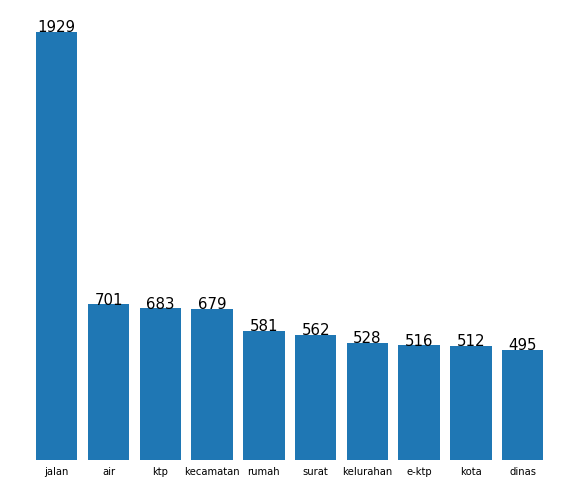

In [17]:
token = [sublist for l in token_keluhan for sublist in l]
counts = dict(Counter(token).most_common(10))
labels, values = zip(*counts.items())

# sort your values in descending order
indSort = np.argsort(values)[::-1]

# rearrange your data
labels = np.array(labels)[indSort]
values = np.array(values)[indSort]

indexes = np.arange(len(labels))

bar_width = 1

mybar=plt.bar(indexes, values)
# get rid of the frame
for spine in plt.gca().spines.values():
    spine.set_visible(False)

# remove all the ticks and directly label each bar with respective value
plt.tick_params(top='off', bottom='off', left='off', right='off', labelleft='off', labelbottom='on')

# plt.show()

# direct label each bar with Y axis values
for bari in mybar:
    height = bari.get_height()
    plt.gca().text(bari.get_x() + bari.get_width()/2, bari.get_height()-0.2, str(int(height)),
                 ha='center', color='black', fontsize=15)
# add labels
plt.xticks(indexes, labels)
plt.show()

In [18]:
#membentuk tfidf
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
matrix = vectorizer.fit_transform(trainfinal)
int_matrix=matrix.astype(np.int64)

C:\Users\Laptop\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:1059: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if hasattr(X, 'dtype') and np.issubdtype(X.dtype, np.float):


In [19]:
#terms data
terms = vectorizer.get_feature_names()
print(len(terms))

13871


In [20]:
num_words = 0
for line in noline:
    words = line.split()
    num_words += len(words)
print("Number of words:")
print(num_words)

Number of words:
213079


In [21]:
#membuat DTM
from sklearn.feature_extraction.text import CountVectorizer

vec = CountVectorizer()
X = vec.fit_transform(trainfinal)
df = pd.DataFrame(X.toarray(), columns=vec.get_feature_names())
df

,aamiin,aan,ab,abaca,abadi,abaikan,abang,abd,abdi,abdul,...,ģg,αtαѕ,ات,اك,الس,السلام,الله,عليكم,لا,𝘶𝘱𝘥𝘢𝘵𝘦
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [22]:
for i, feature in enumerate(vectorizer.get_feature_names()):
    print(i, feature)
    

0 aamiin
1 aan
2 ab
3 abaca
4 abadi
5 abaikan
6 abang
7 abd
8 abdi
9 abdul
10 abg
11 abidin
12 abis
13 abonemen
14 abonmen
15 about
16 abs
17 absen
18 absensi
19 abu
20 abubakar
21 ac
22 acara
23 acaranya
24 acc
25 access
26 account
27 accurated
28 aceh
29 ach
30 achmad
31 acr
32 acra
33 actingnya
34 action
35 actionny
36 actionnya
37 acuan
38 acuh
39 acurat
40 ad
41 ada
42 adaa
43 adab
44 adain
45 adakah
46 adakan
47 adalag
48 adany
49 address
50 ade
51 adek
52 adfik
53 adha
54 adhitya
55 adhiwacana
56 adi
57 adihusada
58 adik
59 adil
60 adipura
61 aditya
62 adiwirakusuma
63 adja
64 adk
65 adkah
66 adl
67 adlah
68 adlh
69 adm
70 administrasi
71 administrasitrims
72 administratif
73 administration
74 adminjam
75 adminmedia
76 adminstrasi
77 adok
78 adri
79 adu
80 aduan
81 aduhkan
82 adukan
83 advertising
84 adzan
85 adzikra
86 ae
87 aedangkan
88 aehari
89 aerah
90 afandi
91 affan
92 afgani
93 afiat
94 afifah
95 ag
96 aga
97 agama
98 agen
99 agenda
100 ageng
101 agr
102 agraria
103 agro

1195 berkonsultasi
1196 berkontribusi
1197 berkoordinasi
1198 berkorban
1199 berktp
1200 berkualitas
1201 berkuasa
1202 berkuliah
1203 berkulit
1204 berkumpul
1205 berkumpulnya
1206 berkunjung
1207 berkurang
1208 berkurangnya
1209 berkursi
1210 berkutat
1211 berkutu
1212 berlagsung
1213 berlaku
1214 berlakukan
1215 berlakuknay
1216 berlakunya
1217 berlalu
1218 berlama
1219 berlanjut
1220 berlantai
1221 berlarian
1222 berlarut
1223 berlawanan
1224 berlayar
1225 berlebaran
1226 berlebih
1227 berlgs
1228 berlian
1229 berlibang
1230 berlimpah
1231 berlobang
1232 berlokasi
1233 berloksasi
1234 berlubang
1235 berlubangnya
1236 berlubangx
1237 berlumpur
1238 berm
1239 bermain
1240 bermanfaat
1241 bermartabat
1242 bermasalah
1243 bermaslaah
1244 bermaterai
1245 bermesraan
1246 bermimpi
1247 berminat
1248 berminggu
1249 bermitra
1250 bermobil
1251 bermotor
1252 bermuatan
1253 bermukim
1254 bermunculan
1255 bermutu
1256 bernafas
1257 bernama
1258 berniat
1259 berniatan
1260 bernilai
1261 bernomo

2040 cpns
2041 cpnya
2042 cpt
2043 cptra
2044 cq
2045 cr
2046 crab
2047 crane
2048 crazy
2049 cream
2050 cri
2051 critanya
2052 cross
2053 crowdid
2054 cs
2055 csr
2056 ct
2057 ctak
2058 cuaca
2059 cuci
2060 cucu
2061 cucunya
2062 cukit
2063 cukiup
2064 culinary
2065 cultural
2066 culture
2067 culvert
2068 culvet
2069 cuman
2070 cumpat
2071 cup
2072 curhat
2073 curhatan
2074 currently
2075 curvlet
2076 customer
2077 custumer
2078 cuti
2079 cutup
2080 cuvlter
2081 cv
2082 cwu
2083 cz
2084 da
2085 daanya
2086 daapt
2087 dada
2088 dadakan
2089 dadi
2090 dadine
2091 daeeah
2092 daerah
2093 daerahnya
2094 daerh
2095 dafta
2096 daftar
2097 daftaran
2098 daftarkan
2099 daftarnya
2100 dagang
2101 dagangan
2102 dagangannya
2103 daging
2104 dagunya
2105 dahak
2106 dahan
2107 dahannya
2108 dahanpohon
2109 dahlan
2110 dahulunya
2111 dalan
2112 dalanan
2113 dam
2114 damai
2115 dambaan
2116 damen
2117 dampak
2118 dampaknya
2119 damri
2120 dana
2121 danakarya
2122 dananya
2123 danau
2124 dance
2125 d

2871 diperjual
2872 diperjualbelikan
2873 diperkampungan
2874 diperkecil
2875 diperkenankan
2876 diperketat
2877 diperlakukan
2878 diperlebar
2879 dipermainkan
2880 dipermasalahkan
2881 dipermudah
2882 diperoleh
2883 diperpanjang
2884 dipersilahkn
2885 dipersingkat
2886 dipersulit
2887 dipertanggung
2888 dipertanggungjawabkan
2889 dipertengahan
2890 dipertigaan
2891 dipertimbangkan
2892 diperumahan
2893 diperuntukkan
2894 dipidanakan
2895 dipikir
2896 dipikirkan
2897 dipilih
2898 dipindah
2899 dipindahkan
2900 diping
2901 dipinggir
2902 dipingir
2903 dipingpong
2904 dipintarri
2905 dipintu
2906 dipisah
2907 dipnaker
2908 dipo
2909 dipohon
2910 dipojokan
2911 dipompa
2912 diponegoro
2913 diponggo
2914 diport
2915 diposisikan
2916 dipotong
2917 diprbaiki
2918 diprediksi
2919 diprint
2920 diprioritaskan
2921 diproses
2922 dipsng
2923 diptoses
2924 dipublikasikan
2925 dipukul
2926 dipulangkan
2927 dipungut
2928 dipusat
2929 diputar
2930 diputaran
2931 diputuskan
2932 dirampungkan
2933 dira

4282 hubungannya
4283 hubungi
4284 huda
4285 hudayanto
4286 hujan
4287 hujannya
4288 hukmi
4289 hukum
4290 hukumnya
4291 hulu
4292 humada
4293 human
4294 humas
4295 humor
4296 huni
4297 hunian
4298 huruf
4299 husada
4300 hut
4301 hutagaol
4302 hutan
4303 hutang
4304 hvs
4305 hypermart
4306 hypmc
4307 ibadah
4308 ibis
4309 ibrahim
4310 ibtidahiyah
4311 ibu
4312 ibuk
4313 ibukk
4314 ibukku
4315 ibukota
4316 ibulah
4317 ibunda
4318 ibunya
4319 ibupetugas
4320 ice
4321 ichsan
4322 ichsananda
4323 icon
4324 id
4325 idam
4326 idaman
4327 ide
4328 ideal
4329 identik
4330 identitas
4331 identitasnya
4332 identity
4333 idi
4334 idpel
4335 idul
4336 ied
4337 ifan
4338 iformasi
4339 igd
4340 ign
4341 ii
4342 iia
4343 iii
4344 iiic
4345 ijasa
4346 ijasah
4347 ijasahnya
4348 ijazah
4349 ijin
4350 ijinkan
4351 ijinnya
4352 ijo
4353 ijone
4354 ika
4355 ikado
4356 ikan
4357 ikana
4358 ikatan
4359 ikhlas
4360 iki
4361 ikkousha
4362 iklan
4363 iklim
4364 ikon
4365 ikt
4366 iku
4367 ikutan
4368 ikuti
436

5035 karangtaruna
5036 karangwismo
5037 karaoke
5038 karapan
5039 karat
5040 karawang
5041 karcis
5042 karema
5043 karen
5044 karena
5045 karenakan
5046 karenkan
5047 karenna
5048 karep
5049 karet
5050 karim
5051 karimata
5052 karir
5053 karna
5054 karnakan
5055 karnival
5056 karo
5057 karpet
5058 karrna
5059 kartangpilang
5060 kartar
5061 kartika
5062 kartini
5063 kartu
5064 kartunya
5065 karung
5066 karunia
5067 karwo
5068 karya
5069 karyawan
5070 karyawanmisal
5071 karyawannya
5072 kas
5073 kasar
5074 kasaran
5075 kasatgas
5076 kasatpol
5077 kasek
5078 kash
5079 kasi
5080 kasian
5081 kasiani
5082 kasianingrum
5083 kasih
5084 kasihan
5085 kasihani
5086 kasihh
5087 kasik
5088 kasil
5089 kasmadi
5090 kasur
5091 kasus
5092 kata
5093 katamso
5094 katamya
5095 katax
5096 kate
5097 kategori
5098 kathah
5099 katholik
5100 katolik
5101 katung
5102 kaum
5103 kauman
5104 kav
5105 kavling
5106 kawan
5107 kawasan
5108 kawatih
5109 kawatir
5110 kawin
5111 kawinan
5112 kaya
5113 kayak
5114 kayakny

5801 km
5802 kmarin
5803 kmbali
5804 kmbl
5805 kmbli
5806 kmd
5807 kmdian
5808 kmdn
5809 kmi
5810 kmn
5811 kmpng
5812 kmpung
5813 kmr
5814 kmren
5815 kmrn
5816 kms
5817 kmudian
5818 kn
5819 kna
5820 knaikan
5821 knalpot
5822 knalpotnya
5823 knapa
5824 kndala
5825 kndgsari
5826 knfirmsi
5827 know
5828 knpa
5829 knri
5830 kntor
5831 kntr
5832 ko
5833 kodam
5834 kode
5835 kodisi
5836 kodratnya
5837 kofirmasi
5838 kog
5839 kohar
5840 koleksi
5841 kolektif
5842 kolektive
5843 kolom
5844 kolombo
5845 kolot
5846 kolusi
5847 kombes
5848 komedi
5849 komen
5850 komentar
5851 komersial
5852 komindo
5853 kominfo
5854 komisi
5855 komit
5856 komite
5857 komitmen
5858 komodo
5859 komp
5860 kompak
5861 kompare
5862 kompensasi
5863 kompensasinya
5864 kompetisi
5865 kompetitif
5866 kompl
5867 komplain
5868 komplek
5869 kompleks
5870 komplen
5871 komplit
5872 komponen
5873 kompos
5874 komprehensif
5875 komputer
5876 komputerisasi
5877 komputermnya
5878 komputernya
5879 komunikasi
5880 komunikatif
5881 ko

6572 maha
6573 mahakarya
6574 mahal
6575 mahalnya
6576 maharini
6577 mahasiswa
6578 mahasiswi
6579 mahir
6580 mahkluk
6581 mahus
6582 mail
6583 mailtoheryanto
6584 main
6585 mainan
6586 mainboard
6587 mainhole
6588 majalah
6589 majapahit
6590 majen
6591 maji
6592 majid
6593 maju
6594 makadari
6595 makam
6596 makan
6597 makanan
6598 makannya
6599 makasar
6600 makasi
6601 makasih
6602 makassar
6603 make
6604 makek
6605 makelar
6606 maker
6607 maklum
6608 makmu
6609 makmur
6610 maks
6611 maksa
6612 maksdnya
6613 maksimal
6614 maksimum
6615 maksud
6616 maksude
6617 maksudnya
6618 maksutnya
6619 mal
6620 mala
6621 malag
6622 malaikat
6623 malak
6624 malam
6625 malan
6626 malang
6627 malas
6628 malaysia
6629 malem
6630 males
6631 maling
6632 malinggggg
6633 mall
6634 mallgm
6635 malu
6636 mama
6637 mambantu
6638 mambuat
6639 mampet
6640 mampetjuga
6641 mampuan
6642 man
6643 mana
6644 manado
6645 management
6646 manager
6647 managment
6648 manajemen
6649 manakah
6650 manambah
6651 mananggal
6

7367 mengahiskan
7368 mengajak
7369 mengajar
7370 mengajukan
7371 mengajukannya
7372 mengakibatkan
7373 mengakomodir
7374 mengakses
7375 mengaktifkan
7376 mengaku
7377 mengakui
7378 mengakuinya
7379 mengalah
7380 mengalam
7381 mengalami
7382 mengalaminya
7383 mengalir
7384 mengaliri
7385 mengalirkan
7386 mengalirnya
7387 mengalirpun
7388 mengalokasikan
7389 mengamankan
7390 mengambil
7391 mengambili
7392 mengambilkan
7393 mengambilnya
7394 mengampaikan
7395 menganalisis
7396 mengancam
7397 mengandalkan
7398 menganga
7399 mengangah
7400 menganggap
7401 menganggkut
7402 menganggu
7403 menganggur
7404 mengangkat
7405 mengangkut
7406 mengangsu
7407 mengangu
7408 menganjurkan
7409 mengantar
7410 mengantarkan
7411 menganti
7412 mengantisipasi
7413 mengantre
7414 mengantri
7415 mengapdi
7416 mengapresiasi
7417 mengapung
7418 mengara
7419 mengarah
7420 mengarahkan
7421 mengartikannya
7422 mengasih
7423 mengasikkan
7424 mengasuh
7425 mengasuransikan
7426 mengatasi
7427 mengatasinya
7428 mengata

8016 mj
8017 mjd
8018 mk
8019 mkasi
8020 mkci
8021 mkdh
8022 mkm
8023 mkqke
8024 mks
8025 mksd
8026 mksh
8027 mksiih
8028 ml
8029 mlah
8030 mlai
8031 mlaku
8032 mlakukan
8033 mlam
8034 mlanjutkan
8035 mlas
8036 mlebu
8037 mlh
8038 mlm
8039 mm
8040 mmalam
8041 mmbawa
8042 mmberi
8043 mmberikan
8044 mmberitahu
8045 mmberitau
8046 mmbntu
8047 mmbuang
8048 mmbuat
8049 mmbw
8050 mmbwa
8051 mmg
8052 mminta
8053 mmpunyai
8054 mn
8055 mna
8056 mnanyakan
8057 mnc
8058 mncb
8059 mndapat
8060 mndapatkan
8061 mndpt
8062 mndptkan
8063 mnertibkannya
8064 mnetp
8065 mngakui
8066 mngalami
8067 mngambil
8068 mngeluhkan
8069 mngerti
8070 mngetahui
8071 mngganti
8072 mnggnti
8073 mnggu
8074 mnggunakan
8075 mnginformasikan
8076 mngjukan
8077 mngkin
8078 mngkn
8079 mngosongkn
8080 mngurus
8081 mningglkn
8082 mnjadi
8083 mnjawab
8084 mnju
8085 mnjual
8086 mnkh
8087 mnrt
8088 mnt
8089 mnta
8090 mnyampaikan
8091 mnyatakn
8092 mnyebabkan
8093 mnyengat
8094 mnyertakan
8095 mnyimpan
8096 mnyuruh
8097 mo
8098 mob

8769 open
8770 oper
8771 operasi
8772 operasikan
8773 operasional
8774 operasionalnya
8775 operasithn
8776 operational
8777 operator
8778 opersi
8779 operssi
8780 opini
8781 opnam
8782 opname
8783 opo
8784 opoo
8785 oprasional
8786 optik
8787 optimal
8788 optimalkan
8789 or
8790 ora
8791 orang
8792 orange
8793 orangnya
8794 orangtua
8795 orangtuanya
8796 order
8797 orderkan
8798 ordonantie
8799 orenz
8800 organisasi
8801 orgnya
8802 orkes
8803 orng
8804 orthopedi
8805 ortu
8806 ortunya
8807 osis
8808 oso
8809 osowilangun
8810 otak
8811 otaknya
8812 otomatiis
8813 otomatis
8814 otoritas
8815 ousorcing
8816 out
8817 outbond
8818 outsorcing
8819 outsourching
8820 outsourcing
8821 outsoursing
8822 over
8823 overlay
8824 overload
8825 ovtavian
8826 ow
8827 oxsy
8828 oya
8829 pa
8830 pabean
8831 pabjang
8832 pabrik
8833 pacar
8834 pacaran
8835 pacarkeling
8836 pacarkembang
8837 pacuan
8838 pacul
8839 pad
8840 pada
8841 padahala
8842 padam
8843 padamnya
8844 padang
8845 padat
8846 padati
8847

9604 penutupannya
9605 penutupnya
9606 penyababnya
9607 penyakit
9608 penyakitnya
9609 penyalahgunaan
9610 penyaluran
9611 penyambung
9612 penyambungan
9613 penyampaian
9614 penyampain
9615 penyandang
9616 penyanga
9617 penyangganya
9618 penyataan
9619 penyayang
9620 penyayangkan
9621 penyebab
9622 penyebabnya
9623 penyeberang
9624 penyeberangan
9625 penyebrangan
9626 penyebranganzebra
9627 penyederhanaan
9628 penyedia
9629 penyediaan
9630 penyedot
9631 penyegelan
9632 penyelenggara
9633 penyelenggaraan
9634 penyelesaian
9635 penyelesaiananya
9636 penyelesaiannya
9637 penyelesain
9638 penyelewengan
9639 penyempitan
9640 penyemprotan
9641 penyempurnaan
9642 penyerahan
9643 penyesuaian
9644 penyetaan
9645 penyewa
9646 penyimpangan
9647 penyuluhan
9648 penyuluhannya
9649 penyumbatan
9650 people
9651 pepohonan
9652 per
9653 peracangan
9654 peraga
9655 perahu
9656 perak
9657 peralatan
9658 peralihan
9659 perampasan
9660 perampingan
9661 perampokan
9662 perampoknya
9663 peran
9664 perancanga

10316 proposal
10317 prose
10318 prosedur
10319 prosedurnya
10320 proses
10321 prosesnya
10322 prosesya
10323 prostitusi
10324 proteksionis
10325 protektif
10326 protes
10327 protokol
10328 protol
10329 proudcitizen
10330 prov
10331 provinsi
10332 proyek
10333 proyeknya
10334 proyeksi
10335 prr
10336 prubahan
10337 prudential
10338 prusahaan
10339 ps
10340 psd
10341 psdiii
10342 psikolog
10343 psikologi
10344 psikologis
10345 psikologisnya
10346 psr
10347 psswrd
10348 psswrod
10349 pt
10350 ptc
10351 ptgs
10352 ptjsr
10353 ptk
10354 ptn
10355 ptoyek
10356 ptpn
10357 pts
10358 ptt
10359 ptugas
10360 ptugasnya
10361 ptus
10362 pu
10363 puas
10364 puasa
10365 puasaan
10366 pub
10367 public
10368 publik
10369 publikasi
10370 publikasikan
10371 publiknya
10372 publish
10373 pucang
10374 pucangan
10375 pucangsewu
10376 pucsng
10377 pudar
10378 puhan
10379 pujasera
10380 puji
10381 pukeesmas
10382 pukesma
10383 pukesmas
10384 pukis
10385 pulang
10386 pulangkan
10387 pulangnya
10388 pulau
1038

11065 sb
11066 sbagai
11067 sbb
11068 sbelum
11069 sbelumnya
11070 sbesar
11071 sbg
11072 sbgai
11073 sbgmn
11074 sblah
11075 sblelum
11076 sblh
11077 sblm
11078 sblmny
11079 sblmnya
11080 sblumnya
11081 sblumx
11082 sbm
11083 sbmnya
11084 sbmptn
11085 sbnarnya
11086 sbnrnya
11087 sbntr
11088 sbsr
11089 sbulan
11090 sby
11091 sbya
11092 scan
11093 scara
11094 schooling
11095 scr
11096 scra
11097 screening
11098 screenshoot
11099 sd
11100 sdah
11101 sdang
11102 sdangkan
11103 sdg
11104 sdgkan
11105 sdgkn
11106 sdi
11107 sdikit
11108 sdikitkami
11109 sdkit
11110 sdkt
11111 sdlb
11112 sdm
11113 sdmnya
11114 sdn
11115 sdr
11116 sdri
11117 se
11118 seabreg
11119 seadanya
11120 seakan
11121 seandainya
11122 searah
11123 season
11124 sebabkan
11125 sebagaian
11126 sebanding
11127 sebanyak
11128 sebar
11129 sebarkan
11130 sebatangkara
11131 sebatas
11132 sebayak
11133 sebelah
11134 sebelahnya
11135 sebelumaya
11136 sebelummnya
11137 sebelumya
11138 sebelun
11139 sebenar
11140 sebenarny
11141 s

11758 skill
11759 skitar
11760 skitr
11761 skitrnya
11762 skl
11763 sklh
11764 skli
11765 skm
11766 skola
11767 skolah
11768 skot
11769 skpd
11770 skr
11771 skrang
11772 skripsi
11773 skrk
11774 skrng
11775 skrt
11776 sks
11777 skt
11778 sktm
11779 sktr
11780 sktrnya
11781 sktt
11782 sku
11783 sky
11784 skyvision
11785 slah
11786 slain
11787 slalu
11788 slama
11789 slamat
11790 slamet
11791 slauran
11792 slesai
11793 slesaiakn
11794 slh
11795 slip
11796 sll
11797 slm
11798 slmat
11799 slmt
11800 slsai
11801 slta
11802 sltp
11803 slum
11804 sm
11805 sma
11806 smakin
11807 sman
11808 smapah
11809 smart
11810 smg
11811 smga
11812 smile
11813 smk
11814 smkn
11815 smn
11816 smntra
11817 smoga
11818 smp
11819 smpah
11820 smpai
11821 smpaikan
11822 smpat
11823 smpe
11824 smpek
11825 smph
11826 smpn
11827 sms
11828 smu
11829 smua
11830 smw
11831 sndiri
11832 sndr
11833 sngat
11834 snggup
11835 sngt
11836 sni
11837 snm
11838 snmptn
11839 so
11840 soalanya
11841 soale
11842 soalnnya
11843 soalx


12534 terabaikan
12535 terakhr
12536 terakreditasi
12537 teraliri
12538 teramat
12539 terampas
12540 terancam
12541 terang
12542 terangkat
12543 terangkut
12544 terantuk
12545 terapkan
12546 teras
12547 teraspal
12548 teratai
12549 teratas
12550 teratasi
12551 teratur
12552 teraturnya
12553 terawat
12554 teraweh
12555 terbaca
12556 terbahak
12557 terbaik
12558 terbaiknya
12559 terbakar
12560 terbalik
12561 terbang
12562 terbangun
12563 terbantu
12564 terbaring
12565 terbaru
12566 terbatas
12567 terbawa
12568 terbebani
12569 terbendung
12570 terbengkalai
12571 terbentang
12572 terbentuklah
12573 terbentuknya
12574 terbentur
12575 terbesar
12576 terbiasa
12577 terbilang
12578 terbit
12579 terbitan
12580 terbitkan
12581 terbitnya
12582 terblokir
12583 terbuang
12584 terbuka
12585 terbukti
12586 terburu
12587 tercabut
12588 tercamtum
12589 tercantum
12590 tercantumkan
12591 tercatat
12592 tercecer
12593 tercemar
12594 tercetak
12595 tercinta
12596 tercipta
12597 terciptanya
12598 terdaftar

13230 tulisannya
13231 tuliskan
13232 tulung
13233 tulungono
13234 tumah
13235 tumbang
13236 tumbuh
13237 tumbuhan
13238 tumbuhnya
13239 tumpah
13240 tumpang
13241 tumpukan
13242 tuna
13243 tunai
13244 tunanetra
13245 tunda
13246 tundaektp
13247 tungakan
13248 tunggakan
13249 tunggal
13250 tunggu
13251 tunggu²
13252 tunjangan
13253 tunjukkan
13254 tunjungan
13255 tuntas
13256 tuntaskan
13257 tuntun
13258 tuntut
13259 tuntutan
13260 tupai
13261 tupoksi
13262 tupoksinya
13263 turi
13264 turis
13265 turmudi
13266 turn
13267 turun
13268 turunan
13269 tutp
13270 tutup
13271 tutupi
13272 tutupin
13273 tutupnya
13274 tuwowo
13275 tv
13276 tvri
13277 tvrxy
13278 tw
13279 twitter
13280 tx
13281 ty
13282 tya
13283 uang
13284 uangnya
13285 uangpdhl
13286 uanh
13287 uas
13288 ubah
13289 ubaya
13290 ubayaantara
13291 ubi
13292 ucapakan
13293 ucapan
13294 ucapkan
13295 ucapkn
13296 udan
13297 udang
13298 udara
13299 ugal
13300 ugalan
13301 ugm
13302 ugo
13303 uinsa
13304 ujan
13305 uji
13306 ujian
1

In [23]:
from sklearn.metrics.pairwise import cosine_similarity
dist = 1 - cosine_similarity(matrix)
print(dist)

[[ 0.00000000e+00  9.71316135e-01  1.00000000e+00 ...  1.00000000e+00
   1.00000000e+00  1.00000000e+00]
 [ 9.71316135e-01  0.00000000e+00  9.53742566e-01 ...  1.00000000e+00
   9.69486554e-01  9.31792022e-01]
 [ 1.00000000e+00  9.53742566e-01  0.00000000e+00 ...  1.00000000e+00
   1.00000000e+00  1.00000000e+00]
 ...
 [ 1.00000000e+00  1.00000000e+00  1.00000000e+00 ...  0.00000000e+00
   1.00000000e+00  1.00000000e+00]
 [ 1.00000000e+00  9.69486554e-01  1.00000000e+00 ...  1.00000000e+00
   0.00000000e+00  8.75971405e-01]
 [ 1.00000000e+00  9.31792022e-01  1.00000000e+00 ...  1.00000000e+00
   8.75971405e-01 -2.22044605e-16]]


In [24]:
from sklearn.decomposition import NMF, LatentDirichletAllocation
tf_vectorizer = CountVectorizer(min_df=3)
tf = tf_vectorizer.fit_transform(trainfinal)
tf

<4206x4319 sparse matrix of type '<class 'numpy.int64'>'
	with 69060 stored elements in Compressed Sparse Row format>

In [25]:
#Sparsicity is nothing but the percentage of non-zero datapoints in the document-word matrix, that is data_vectorized.

#Since most cells in this matrix will be zero, I am interested in knowing what percentage of cells contain non-zero values.

# Materialize the sparse data
data_dense = tf.todense()

# Compute Sparsity = Percentage of Non-Zero cells
print("Sparsity: ", ((data_dense > 0).sum()/data_dense.size)*100, "%")

Sparsity:  0.38016672507339927 %


In [26]:
import lda
model = lda.LDA(n_topics=15, random_state=1, n_iter=500)
model.fit(tf)
lda_representation = model.doc_topic_
lda_representation.shape

INFO:lda:n_documents: 4206
INFO:lda:vocab_size: 4319
INFO:lda:n_words: 87810
INFO:lda:n_topics: 15
INFO:lda:n_iter: 500
C:\Users\Laptop\Anaconda3\lib\site-packages\lda\utils.py:55: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int32 == np.dtype(int).type`.
  if sparse and not np.issubdtype(doc_word.dtype, int):
INFO:lda:<0> log likelihood: -1059219
INFO:lda:<10> log likelihood: -720956
INFO:lda:<20> log likelihood: -690171
INFO:lda:<30> log likelihood: -678957
INFO:lda:<40> log likelihood: -672906
INFO:lda:<50> log likelihood: -669229
INFO:lda:<60> log likelihood: -665930
INFO:lda:<70> log likelihood: -663825
INFO:lda:<80> log likelihood: -661742
INFO:lda:<90> log likelihood: -659641
INFO:lda:<100> log likelihood: -658898
INFO:lda:<110> log likelihood: -657812
INFO:lda:<120> log likelihood: -656784
INFO:lda:<130> log likelihood: -656077
INFO:lda:<140> log likelihood: -655710
INFO:lda:<

(4206, 15)

In [27]:
nzw=model.nzw_
ndz=model.ndz_
nz=model.nz_

nzw.shape

(15, 4319)

For n_clusters=2, The SSE is 1203.3107062980343
For n_clusters=3, The SSE is 1065.6051405985943
For n_clusters=4, The SSE is 926.7900136543078
For n_clusters=5, The SSE is 840.7790508544999
For n_clusters=6, The SSE is 758.8484111713956
For n_clusters=7, The SSE is 686.360811373196
For n_clusters=8, The SSE is 619.3125181162555
For n_clusters=9, The SSE is 547.5766795971641
For n_clusters=10, The SSE is 499.94860226876517
For n_clusters=11, The SSE is 446.30802687283074
For n_clusters=12, The SSE is 403.3234922199926
For n_clusters=13, The SSE is 368.30383290598735
For n_clusters=14, The SSE is 348.2398021817539
For n_clusters=15, The SSE is 318.8099517248585
For n_clusters=16, The SSE is 308.8576201780944
For n_clusters=17, The SSE is 299.06938799178425
For n_clusters=18, The SSE is 293.1231660889233
For n_clusters=19, The SSE is 284.47346058853464
For n_clusters=20, The SSE is 279.2043399413394


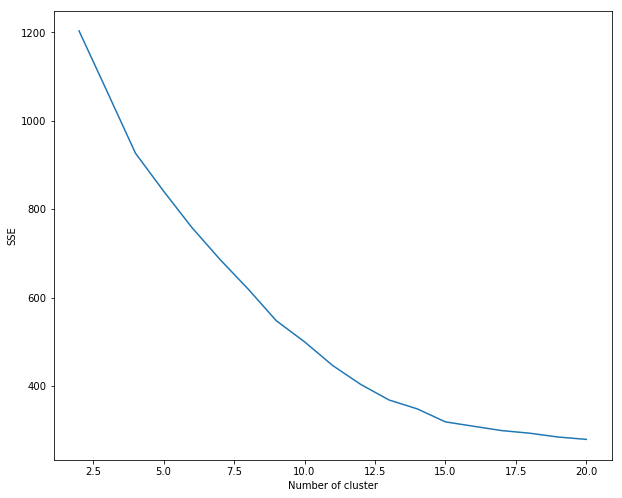

In [28]:
#mendapatkan SSE untuk klaster optimum

from sklearn.cluster import KMeans

import matplotlib.pyplot as plt
max_klaster=21

sse = {}
for k in range(2, max_klaster):
    kmeans = KMeans(n_clusters=k,random_state=1).fit(lda_representation)
    clusters = kmeans.labels_.tolist()
    clusters_df=pd.DataFrame(clusters)
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
    print("For n_clusters={}, The SSE is {}".format(k, sse[k]))
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

In [29]:
#mendapatkan silhouette value untuk klaster optimum
from sklearn.metrics import silhouette_score

for n_cluster in range(2, max_klaster):
    kmeans = KMeans(n_clusters=n_cluster,random_state=1).fit(lda_representation)
    label = kmeans.labels_
    sil_coeff = silhouette_score(lda_representation, label, metric='euclidean')
    print("For n_clusters={}, The Silhouette Coefficient is {}".format(n_cluster, sil_coeff))

For n_clusters=2, The Silhouette Coefficient is 0.14443705702596235
For n_clusters=3, The Silhouette Coefficient is 0.17034057075508707
For n_clusters=4, The Silhouette Coefficient is 0.2187087955262997
For n_clusters=5, The Silhouette Coefficient is 0.23509123365909862
For n_clusters=6, The Silhouette Coefficient is 0.26383243458693495
For n_clusters=7, The Silhouette Coefficient is 0.28836495777935456
For n_clusters=8, The Silhouette Coefficient is 0.31153345375051317
For n_clusters=9, The Silhouette Coefficient is 0.33559020337119466
For n_clusters=10, The Silhouette Coefficient is 0.3496787662320624
For n_clusters=11, The Silhouette Coefficient is 0.3698884606099304
For n_clusters=12, The Silhouette Coefficient is 0.3845328186897556
For n_clusters=13, The Silhouette Coefficient is 0.3975113979616621
For n_clusters=14, The Silhouette Coefficient is 0.4012951272842701
For n_clusters=15, The Silhouette Coefficient is 0.4115530379610267
For n_clusters=16, The Silhouette Coefficient is 

For n_clusters=2, The CHI is 572.21366656366
For n_clusters=3, The CHI is 594.5753493234746
For n_clusters=4, The CHI is 665.437760125228
For n_clusters=5, The CHI is 657.4423326411304
For n_clusters=6, The CHI is 673.2931885828818
For n_clusters=7, The CHI is 694.0966687995212
For n_clusters=8, The CHI is 724.1191817638241
For n_clusters=9, The CHI is 785.1685838408871
For n_clusters=10, The CHI is 808.6493348742146
For n_clusters=11, The CHI is 865.4791705902298
For n_clusters=12, The CHI is 911.0799368908972
For n_clusters=13, The CHI is 947.5720509476606
For n_clusters=14, The CHI is 943.4353565248308
For n_clusters=15, The CHI is 984.3222694182897
For n_clusters=16, The CHI is 957.078814915902
For n_clusters=17, The CHI is 934.9755280377218
For n_clusters=18, The CHI is 902.6110793701803
For n_clusters=19, The CHI is 885.2491566477474
For n_clusters=20, The CHI is 858.4378620512409


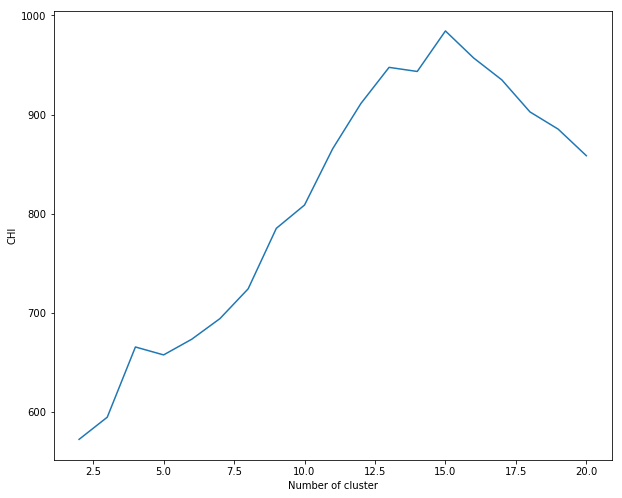

In [30]:
from sklearn import metrics
from sklearn.metrics import pairwise_distances
from sklearn import datasets
import numpy as np
from sklearn.cluster import KMeans

chi = {}
for k in range(2, max_klaster):
    kmeans_model = KMeans(n_clusters=k,random_state=1).fit(lda_representation)
    labels = kmeans_model.labels_
    chi[k] = metrics.calinski_harabaz_score(lda_representation, labels)
    print("For n_clusters={}, The CHI is {}".format(k, chi[k]))
plt.figure()
plt.plot(list(chi.keys()), list(chi.values()))
plt.xlabel("Number of cluster")
plt.ylabel("CHI")
plt.show()

In [31]:
from sklearn.cluster import KMeans
num_clusters=15
kmeans = KMeans(n_clusters=num_clusters,random_state=1)
kmeans.fit(lda_representation)
clusters = kmeans.labels_
clusters

array([13,  0,  5, ..., 14,  7, 10])

In [32]:
#mendapatkan banyak anggota tiap klaster
from sklearn.externals import joblib
joblib.dump(kmeans,  'doc_cluster.pkl')

km = joblib.load('doc_cluster.pkl')
clusters = km.labels_.tolist()
clusters_df=pd.DataFrame(clusters)
clusters_df['klaster']=pd.DataFrame(clusters)
clusters_df['klaster'].value_counts()

2     466
8     432
5     391
0     343
9     332
6     297
7     270
3     242
13    242
11    239
4     229
1     200
14    195
12    189
10    139
Name: klaster, dtype: int64

In [33]:
#membuat data frame anggota klaster 
train_final_df=pd.DataFrame(trainfinal)
train_final_df.columns=['opini']
train_final_df['klaster']=pd.Series(clusters, index=input_df.index)
train_final_df

,opini,klaster
0,menginfokan kondisi air pdam daerah simo pomahan barat gang keruh bau minum mencuci susah terimakasii,13
1,pemkot melaporkan penuhnya sampah got simolawang sekolahan gang ii menyebabkan saluran buntu banjir hujan lebat mohn tangani terimakasih robert prayogo,0
2,melaporkan lampu pertamanan jalan kedung sroko mati titik ditindaklanjuti,5
3,tumpukan sampah banyu urip,6
4,info keputusan sertifikasi tanah surat ijo,7
5,kegiatan bakar ilalang ditertibkan wilayah kelurahan medokan ayu lokasi tpu medokan ayu,1
6,perpanjangan perijinan warnet coba masuk ssw lihat pilihan perpanjangan perijinan warnet bingung mencoba telepon dinas kominfo jimerto coba penerima telepon bilang perijinan online warnet dihapus mengurus perpanjangan perijinan warnet infonya,11
7,ngurus surat keterangan bebas narkoba piye,12
8,dikaji ulang durasi lampu lintas perempatan merr suko semolo arah utara selatan jam sibuk pulang kantor durasi lampu hijau pendek menyebabkan antrian kendaraan mencapai kompleks ruko icon antrian kendaraan arah,6
9,menginformasikan terkait instansi pemerintahan bergerak bidang hukum kota pengadilan negeri kejaksaan kepolisian bercerita pengalaman mei menghadap pengadilan lantaran terkena pelanggaran hukum berkendara kena tilang pasal uu tanggal april bertempat jembatan suramadu kenjaran kantor pengadilan petugas pengadilan pengadilan mengadakan sidang pelanggaran tilang langsung kejaksaan gedung dprd gedung dprd deket kantor kejaksaan beralih samsat colombu urusan tilang berpindah samsat manyar setelh mondar-mandir samsat manyar terkait surat tilngannya samsat yp kamal akhirny kesana lantaran capek bolak-balik instansi terkait jaraknya instansi instansi terkena macet aktivitas kewajiban mahasiswa kuliah pengaduan pelayanan mencarikan tau mengambil surat tilang tilang aparat suruh pengadilan tanggal mei jam sesuai tertera surat tilang mintk informasinya biar mudah mengambilnya,10


In [34]:
train_final_df.to_excel("hasil_klaster2.xlsx")

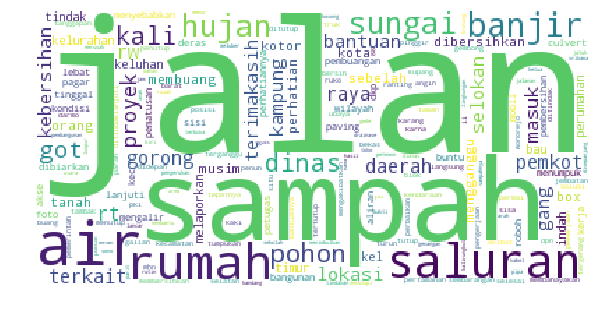

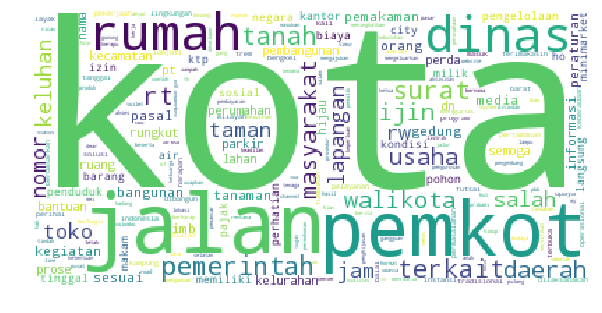

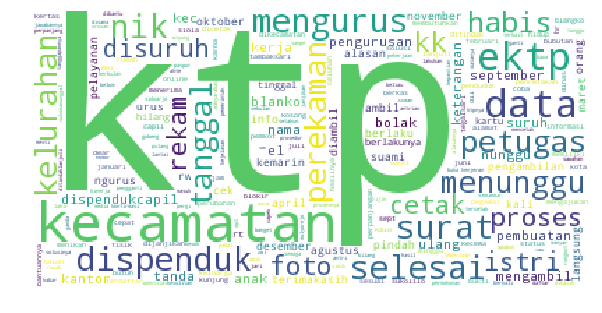

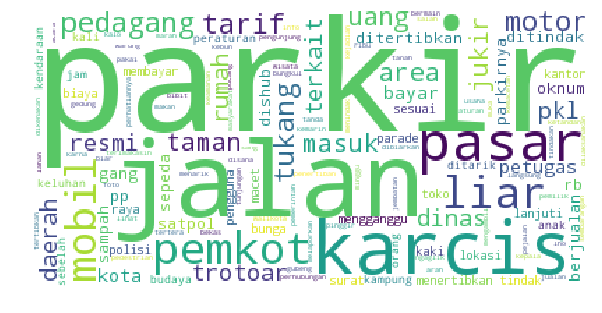

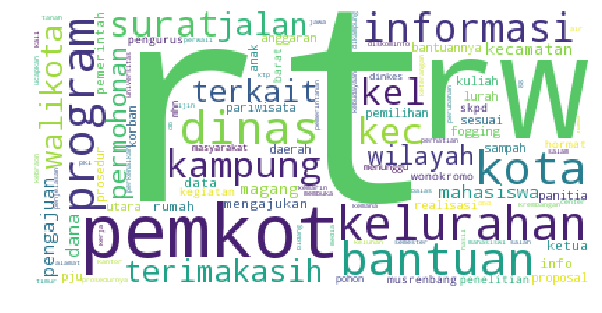

...

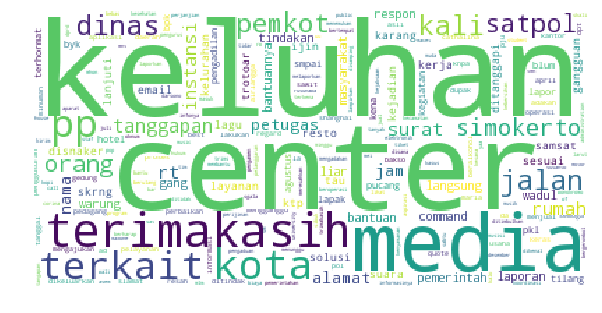

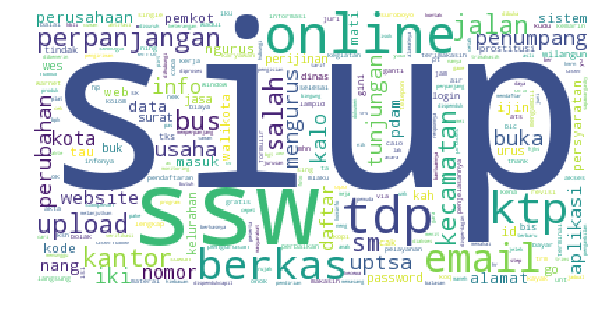

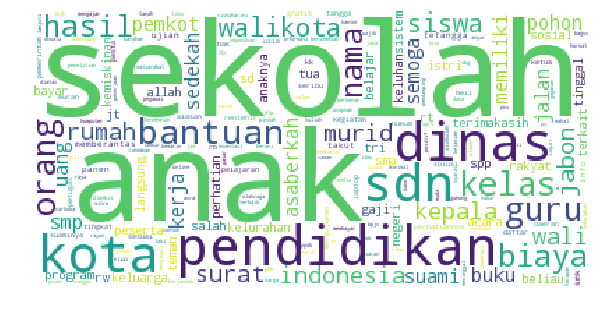

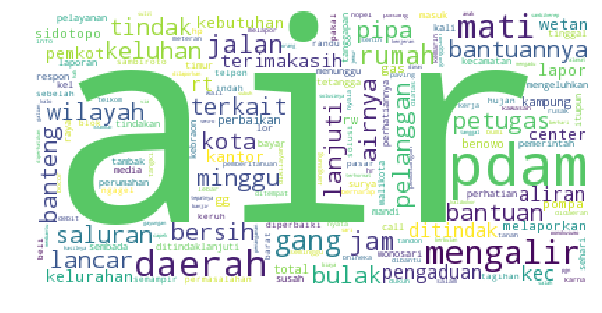

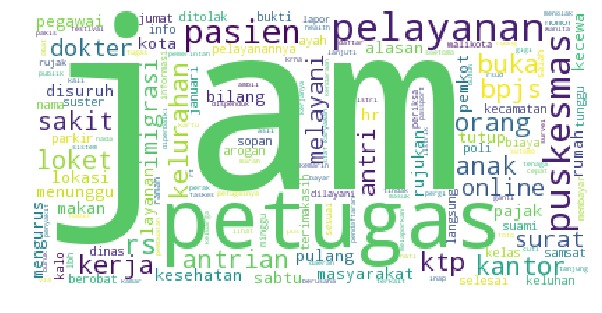

In [35]:
a = {}
b = {}
klaster = {}
i = -1
c = {}
for j in range(num_clusters):
    i += 1
    a[i] = train_final_df.loc[train_final_df['klaster'] == i,'opini']
    b[i] =' '.join(a[i])
    klaster["klaster" + str(i)]  = b[i]
    c[i]= WordCloud(collocations = False,background_color='white',stopwords=stopword,max_words=2000,max_font_size=200,
                    random_state=42).generate(b[i])
    fig = plt.figure(1)
    plt.imshow(c[i])
    plt.axis('off')
    plt.show()